In [ ]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib import font_manager
import seaborn as sns
import os
import folium
from folium.plugins import HeatMap
from folium import Choropleth
import geopandas as gpd
import json
import shapefile
from shapely.geometry import Polygon
from branca.colormap import linear
import geopandas

pd.set_option('display.max_columns',100)

plt.rc('font', family='NanumBarunGothic')
plt.rcParams['axes.unicode_minus'] =False

# !apt-get install -y fonts-nanum
# !fc-cache -fv

font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
fm.fontManager.addfont(font_path)
plt.rcParams['font.family'] = 'NanumGothic'

<Axes: title={'center': '한글 테스트'}>

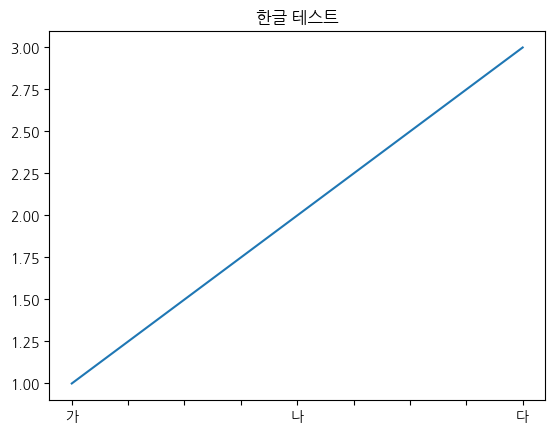

In [ ]:
# 간단한 예제 그래프를 그립니다.

# 예제 데이터를 생성합니다.
import pandas as pd
s = pd.Series([1, 2, 3], index=['가', '나', '다'])

# 그래프를 그립니다.
s.plot(title='한글 테스트')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# 서울 지도 초기화
seoul = folium.Map(location=[37.55, 126.98], zoom_start=11)

# GeoJSON 파일 로드
geo_path = '/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/수연/서울_geojson.geojson'
geo_data = json.load(open(geo_path, encoding='utf-8'))

In [ ]:
folium.GeoJson(
    geo_data,
    name='서울 동별 경계',
    style_function=lambda feature: {
        'fillColor': 'transparent',  # 채우기 색상은 투명
        'color': 'green',  # 경계선 색상 초록
        'weight': 1.4,  # 선 굵기
        'opacity': 1  # 선의 불투명도
    }
).add_to(seoul)

### 행정동별 / 나이대별 인구 현황

## 서울시 공원 개수 비교

In [ ]:
seoul_park_data = pd.read_csv('/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/수연/3전국_도시공원_정보.csv', encoding='cp949')
seoul_park_data['구'] = seoul_park_data['소재지지번주소'].str.split().str[1]
seoul_parks_in_seoul = seoul_park_data[seoul_park_data['소재지지번주소'].str.split().str[0] == '서울특별시']
seoul_parks_in_seoul_data = seoul_parks_in_seoul[['구', '공원명', '위도', '경도', '공원면적']]
seoul_parks_in_seoul_data.head()

,구,공원명,위도,경도,공원면적
58,영등포구,산성어린이공원,37.496977,126.902594,413.0
59,영등포구,다사랑어린이공원,37.492834,126.899215,1632.0
60,영등포구,고추말어린이공원,37.511577,126.907051,3071.0
61,영등포구,대림어린이공원,37.491332,126.903016,6969.0
62,영등포구,서강어린이공원,37.525922,126.905848,1797.0


In [ ]:
park_data = pd.read_csv("/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/수연/5광진구_도시공원_정보.csv")
park_data_cleaned = park_data[['공원명', '공원면적', '동', '동(세부)', '위도', '경도', '공원면적']]
park_data.head(2)

,관리번호,공원명,동,동(세부),공원구분,소재지도로명주소,소재지지번주소,위도,경도,공원면적,공원보유시설(운동시설),공원보유시설(유희시설),공원보유시설(편익시설),공원보유시설(교양시설),공원보유시설(기타시설),지정고시일,관리기관명,전화번호,데이터기준일자
0,11215-10533,온달공원,광장동,광장동,어린이공원,서울특별시 광진구 아차산로73길 15 (광장동),서울특별시 광진구 광장동 242-1,37.545987,127.104076,1012.0,NaN,"조합놀이대, 그네, 흔들놀이기구",화장실,NaN,경로당,11-14-78,서울특별시 광진구청,02-450-7778,03-10-25
1,11215-10534,평강공원,광장동,광장동,어린이공원,NaN,서울특별시 광진구 광장동 387-1,37.548118,127.100578,325.0,NaN,그네,화장실,NaN,NaN,05-18-84,서울특별시 광진구청,02-450-7778,03-10-25


## 격자 분석_초안

In [ ]:
# @title 유소년 인구수 100m

F1 = "/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/1광진구_유소년_인구수_100/nlsp_021001004.shp"
D1 = gpd.read_file(F1, encoding='UTF-8')
D1.loc[D1['val'] >= 240, 'val'] = 230
D1.head(3)

,gid,lbl,val,geometry
0,다사633494,15.00,15.0,"POLYGON ((963300 1949400, 963300 1949500, 9634..."
1,다사626517,18.00,18.0,"POLYGON ((962600 1951700, 962600 1951800, 9627..."
2,다사642512,30.00,30.0,"POLYGON ((964200 1951200, 964200 1951300, 9643..."


In [ ]:
# @title 공시지가 100m
F2 = "/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/2광진구_공시지가_100/nlsp_021004001.shp"
D2 = gpd.read_file(F2, encoding='UTF-8')
D2.head(1)

,gid,lbl,val,geometry
0,다사629496,5658798.87,5658798.87,"POLYGON ((962900 1949600, 962900 1949700, 9630..."


In [ ]:
# @title 생활권공원 서비스권역 내 인구비율 500m
F3 = "/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/3생활권공원_서비스권역_내_인구비율_500/71.1 생활권공원(읍면동) 서비스권역 내 인구비율(0.5km).shp"
D3 = gpd.read_file(F3, encoding='UTF-8')
D3.head(1)

,emd_cd,emd_nm_k,emd_nm_e,sgg_cd,sgg_nm_k,sgg_nm_e,sido_cd,sido_nm_k,sido_nm_e,cd_fac,cd_range,value_r,stats_year,raw_d_year,pop_year,geometry
0,11110101,청운동,Cheongun-dong,11110,종로구,Jongno-gu,11,서울특별시,Seoul,1,0.5,0.0,2023,202310,202310,"POLYGON ((953700.022 1954605.065, 953693.871 1..."


In [ ]:
# @title 생활권공원 접근성 250m
F4 = "/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/4생활권공원_접근성_250/69.1 생활권공원(읍면동격자) 접근성.shp"
D4 = gpd.read_file(F4, encoding='UTF-8')
D4.head(1)

,gid,emd_cd,emd_nm_k,emd_nm_e,sgg_cd,sgg_nm_k,sgg_nm_e,sido_cd,sido_nm_k,sido_nm_e,value,stats_year,raw_d_year,geometry
0,다사53ab54ab,11110101,청운동,Cheongun-dong,11110,종로구,Jongno-gu,11,서울특별시,Seoul,1.099,2023,202310,"POLYGON ((953250 1954250, 953250 1954500, 9535..."


In [ ]:
# @title 고령자 인구수 100m
F5 = "/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/5광진구_고령자_인구수_100/nlsp_021001010.shp"
D5 = gpd.read_file(F5, encoding='UTF-8')
D5.head(1)

,gid,lbl,val,geometry
0,다사633494,47.00,47.0,"POLYGON ((963300 1949400, 963300 1949500, 9634..."


In [ ]:
D3.describe()

,cd_fac,cd_range,value_r,stats_year,raw_d_year,pop_year
count,5065.0,5065.0,5065.000000,5065.0,5065.0,5065.0
mean,1.0,0.5,11.485364,2023.0,202310.0,202310.0
std,0.0,0.0,118.538076,0.0,0.0,0.0
min,1.0,0.5,-999.000000,2023.0,202310.0,202310.0
25%,1.0,0.5,0.000000,2023.0,202310.0,202310.0
50%,1.0,0.5,3.280000,2023.0,202310.0,202310.0
75%,1.0,0.5,46.560000,2023.0,202310.0,202310.0
max,1.0,0.5,100.000000,2023.0,202310.0,202310.0


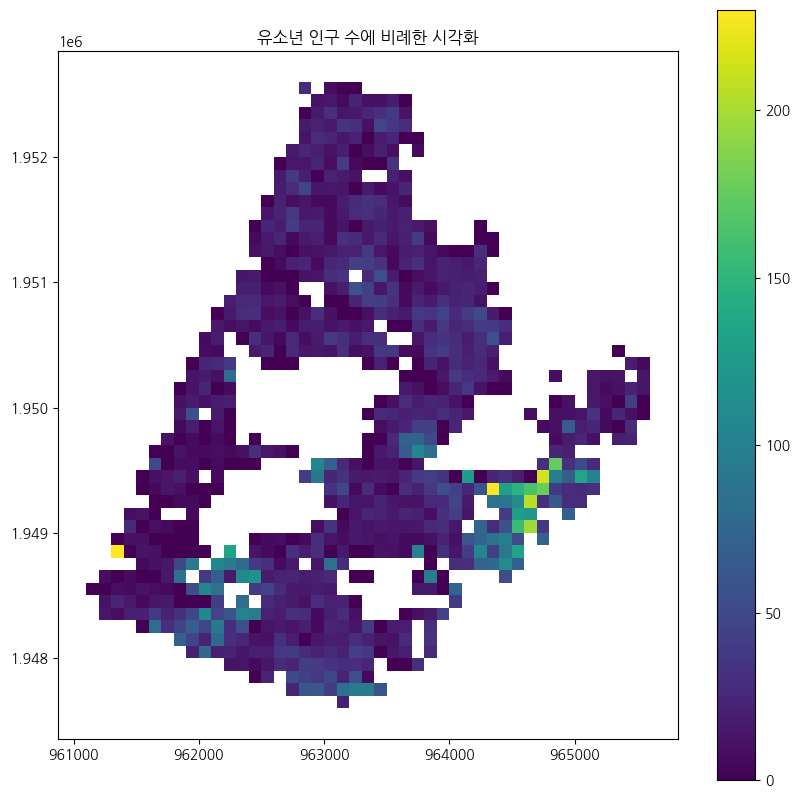

In [ ]:
# @title grid 유소년 인구 분포
fig, ax = plt.subplots(figsize=(10, 10))

# 색상 맵 설정
cmap = plt.cm.viridis
norm = plt.Normalize(vmin=D1['val'].min(), vmax=D1['val'].max())

# 유소년 인구 수에 따라 색상을 다르게 설정하여 시각화
D1.plot(ax=ax, edgecolor="w", column='val', cmap=cmap, linewidth=0.0, legend=True, norm=norm)
plt.title("유소년 인구 수에 비례한 시각화")

plt.show();

In [ ]:
# @title grid 유소년, 지도, 공원

gwangjin_map = folium.Map(location=[37.538, 127.082], tiles='cartodbpositron', zoom_start=13.3)

folium.Choropleth(
    geo_data=D1,
    data=D1,
    columns=['gid', 'val'],
    key_on='feature.properties.gid',
    fill_color='Oranges',
    fill_opacity=0.9,
    line_opacity=0.34,
    nan_fill_color='#758773',
    legend_name='유소년 인구 수'
).add_to(gwangjin_map)

for idx, row in park_data.iterrows():
    folium.Circle(
        location=[row['위도'], row['경도']],  # 위도, 경도
        radius=250,
        color='red',
        weight=0,
        fill=True,
        fill_color='red',
        fill_opacity=0.3,
        popup=row['공원명']
    ).add_to(gwangjin_map)

folium.LayerControl().add_to(gwangjin_map)
#여기에다가 레이어를 추가해서 서클로 표시된걸 끄고 킬수 있게 할래

# 결과 지도 출력
gwangjin_map


In [ ]:
# @title 지역아동센터

kid_df = pd.read_csv('/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/전처리 끝난 데이터/6아동센터.csv')
kid_df.head()

,Unnamed: 0,시설명,시설주소,시설종류명(시설유형),위도,경도
0,18,새움터지역아동센터,"서울특별시 광진구 자양로 71-7, 3층 (자양동, 희년의집)",(아동복지시설) 지역아동센터,37.534086,127.083905
1,19,해피엘지역아동센터,서울특별시 광진구 자양번영로 16 (자양동),(아동복지시설) 지역아동센터,37.531005,127.075249
2,39,중곡지역아동센터,"서울특별시 광진구 자양로53길 69, 3층 (중곡동)",(아동복지시설) 지역아동센터,37.555784,127.090798
3,40,어린이나라지역아동센터,"서울특별시 광진구 자양로22길 58, 2층 (구의동)",(아동복지시설) 지역아동센터,37.539658,127.086509
4,41,새빛지역아동센터,"서울특별시 광진구 자양로21길 35, 2층 (자양동)",(아동복지시설) 지역아동센터,37.539394,127.081411


In [ ]:
# @title 키즈카페

kid_cafe_df = pd.read_csv('/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/전처리 끝난 데이터/9키즈카페.csv')
kid_cafe_df.head()

,Unnamed: 0,시설명,기본주소,위도,경도
0,23,서울형키즈카페 시립 팔각당점,서울특별시 광진구 능동로 216,37.549857,127.082471
1,25,서울형 키즈카페 자양4동 2호점(꾸미팡팡 놀이터),서울특별시 광진구 능동로 87,37.539160,127.069640
2,26,서울형 키즈카페 자양4동 1호점(꾸미팡팡 놀이터),서울특별시 광진구 능동로 87,37.539160,127.069640
3,40,서울형 키즈카페 시립 뚝섬자벌레점,서울특별시 광진구 강변북로 2202,37.530160,127.065410
4,61,서울형 키즈카페 광진구 중곡3동점(꾸미팡팡 놀이터),서울특별시 광진구 능동로 400,37.565429,127.084573


In [ ]:
# @title 유치원

kid_kindergarten_df = pd.read_csv('/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/전처리 끝난 데이터/7유치원.csv')
kid_kindergarten_df.head(2)

,Unnamed: 0,유치원코드,유치원명,주소,위도,경도
0,61,1ecec08c-eee1-b044-e053-0a32095ab044,선경유치원,서울특별시 광진구 뚝섬로66길 14,37.533396,127.089785
1,62,1ecec08c-eee2-b044-e053-0a32095ab044,성산유치원,서울특별시 광진구 뚝섬로59길 18,37.532909,127.084178


In [ ]:
# @title 학교

kid_school_df = pd.read_csv('/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/전처리 끝난 데이터/8초등학교.csv')
kid_school_df = kid_school_df[['학교명', '도로명주소', '위도', '경도']]
kid_school_df.head(2)

,학교명,도로명주소,위도,경도
0,세종초등학교,서울특별시 광진구 군자로 114,37.553011,127.072865
1,성동초등학교,서울특별시 광진구 자양로4길 63,37.533281,127.089281


In [ ]:
# @title 주차장

parking_availability = pd.read_csv('/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/수연/12광진구_주차장_현황.csv')
parking_availability = parking_availability[['주차장명', '소재지도로명주소', '위도', '경도']]
parking_availability.head(40)

,주차장명,소재지도로명주소,위도,경도
0,송림식당길 노상 공영주차장,NaN,NaN,NaN
1,동서울호텔길 노상 공영주차장,NaN,NaN,NaN
2,동서울호텔길 공영주차장,NaN,NaN,NaN
3,신성시장길 노상 공영주차장,NaN,NaN,NaN
4,화양동 공영,서울특별시 광진구 군자로 22,37.545298,127.071181
5,중곡동복개천 노상 공영주차장,NaN,NaN,NaN
6,자양유수지,서울특별시 광진구 뚝섬로52길 58,37.529537,127.078285
7,자양4동 공영,NaN,37.538650,127.068173
8,능동 공영주차장,서울특별시 광진구 천호대로112길 56,37.554043,127.080243
9,광진광장 공영,서울특별시 광진구 광나루로 389,37.547693,127.073216


In [ ]:
# @title 유해시설

hazardous_facilities = pd.read_csv('/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/전처리 끝난 데이터/4청소년 유해시설(업종추가).csv')
hazardous_facilities.head(2)

,Unnamed: 0,사업장명,상세영업상태명,지번주소,업종명,위도,경도
0,0,카라노래바,영업,서울특별시 광진구 화양동 23-39,유흥주점,37.547038,127.066995
1,1,술마시는뮤직노래방,영업,서울특별시 광진구 구의동 228-1,유흥주점,37.544425,127.090725


In [ ]:
# @title 노인복지시설

senior_welfare_facilities = pd.read_csv('/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/전처리 끝난 데이터/11노인복지(결측값 삭제).csv')
senior_welfare_facilities.head(2)

,Unnamed: 0,시설명,시설주소,시설종류명(시설유형),위도,경도
0,0,광진데이케어센터,서울특별시 광진구 군자로 88 (군자동),(노인복지시설) 재가노인복지시설,37.551098,127.071596
1,1,사랑이있는집노인요양공동생활가정,서울특별시 광진구 용마산로8마길 7-10 (중곡동),(노인복지시설) 노인요양공동생활가정,37.560825,127.090240


## 데이터 정리

In [ ]:
youth_population = D1[['gid', 'val', 'geometry']].copy()
youth_population = youth_population.rename(columns={'val': 'youth_population'})

# grid_filled 초기 정의
grid_filled = youth_population.copy()

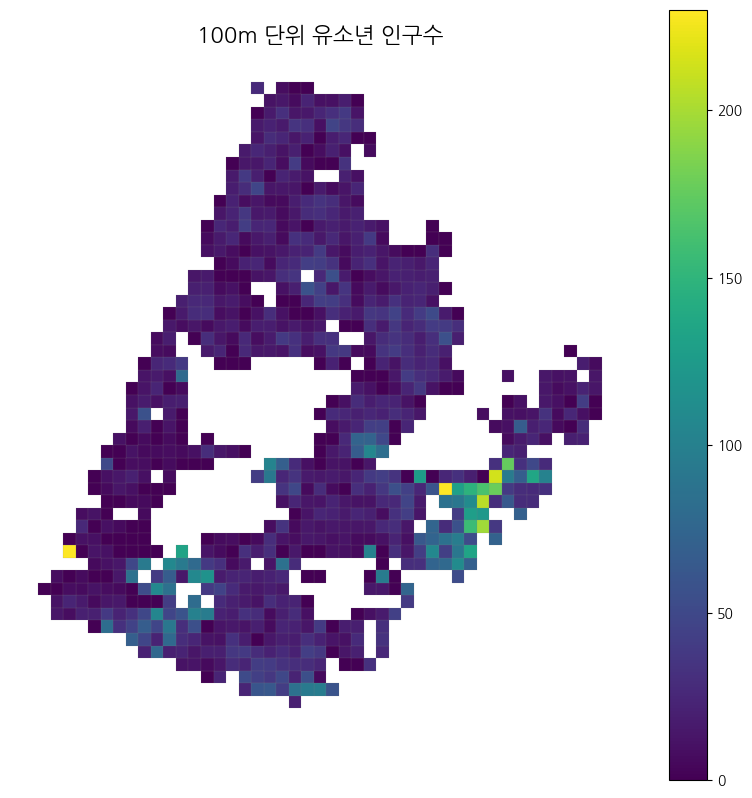

In [ ]:
# @title 유소년 인구 수 시각화
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='youth_population',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 유소년 인구수', fontsize=16)
ax.axis('off')
plt.show()


In [ ]:
# @title 공원 접근성
grid_100m = youth_population[['gid', 'geometry']].copy()
access_250m = D4[['value', 'geometry']].copy()
grid_with_access = gpd.sjoin(grid_100m, access_250m, how='left', predicate='within')
grid_with_access = grid_with_access[['gid', 'value', 'geometry']].rename(columns={'value': 'park_accessibility'})

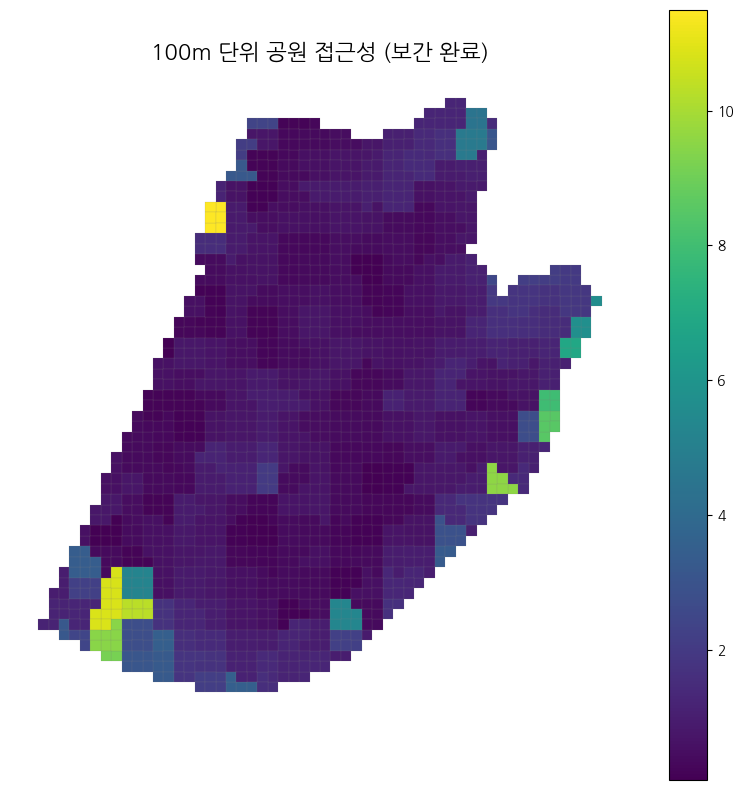

In [ ]:
# @title 공원 접근성 시각화(100m 단위)

from sklearn.neighbors import KDTree

# 1. 결측값 나누기
missing = grid_with_access[grid_with_access['park_accessibility'].isna()].copy()
filled = grid_with_access[grid_with_access['park_accessibility'].notna()].copy()

# 2. 중심점 계산
missing['centroid'] = missing.geometry.centroid
filled['centroid'] = filled.geometry.centroid

# 3. 좌표 배열로 변환
missing_coords = np.array([(pt.x, pt.y) for pt in missing.centroid])
filled_coords = np.array([(pt.x, pt.y) for pt in filled.centroid])

# 4. KNN으로 최근접 이웃 찾기
tree = KDTree(filled_coords)
dist, idx = tree.query(missing_coords, k=1)

# 5. 최근접 접근성 값 채우기
missing['park_accessibility'] = filled.iloc[idx.flatten()]['park_accessibility'].values

# 6. 병합된 접근성 값 추출
park_access_filled = pd.concat([filled, missing])[['gid', 'park_accessibility']]

# 7. 기존 grid_filled에 접근성 컬럼 추가 (merge 방식)
grid_filled = grid_filled.merge(park_access_filled, on='gid', how='left')

# 8. 시각화
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(column='park_accessibility', cmap=cmap, linewidth=0.1, edgecolor='gray', legend=True, ax=ax)
ax.set_title('100m 단위 공원 접근성 (보간 완료)', fontsize=16)
ax.axis('off')
plt.show()


In [ ]:
# @title 어린이공원 위치
from shapely.geometry import Point

# 1. 공원 중심 포인트 → GeoDataFrame
park_data_cleaned['geometry'] = park_data_cleaned.apply(
    lambda row: Point(row['경도'], row['위도']),
    axis=1
)
park_gdf = gpd.GeoDataFrame(park_data_cleaned, geometry='geometry', crs='EPSG:4326')
park_gdf = park_gdf.to_crs(grid_filled.crs)

# 2. 100m 격자의 중심 좌표 계산
grid_filled['centroid'] = grid_filled.geometry.centroid

# 3. 거리 기반 영향력 계산
scores = []

for _, grid_row in grid_filled.iterrows():
    max_score = 0
    for _, park_row in park_gdf.iterrows():
        dist = grid_row['centroid'].distance(park_row['geometry'])  # 거리 계산
        if dist <= 300:
            score = (1 - (dist / 300)) ** 2
            max_score = max(max_score, score)
    scores.append(max_score)

# 4. 영향력 컬럼 추가
grid_filled['child_park_score'] = scores
grid_filled = grid_filled.drop(columns='centroid')


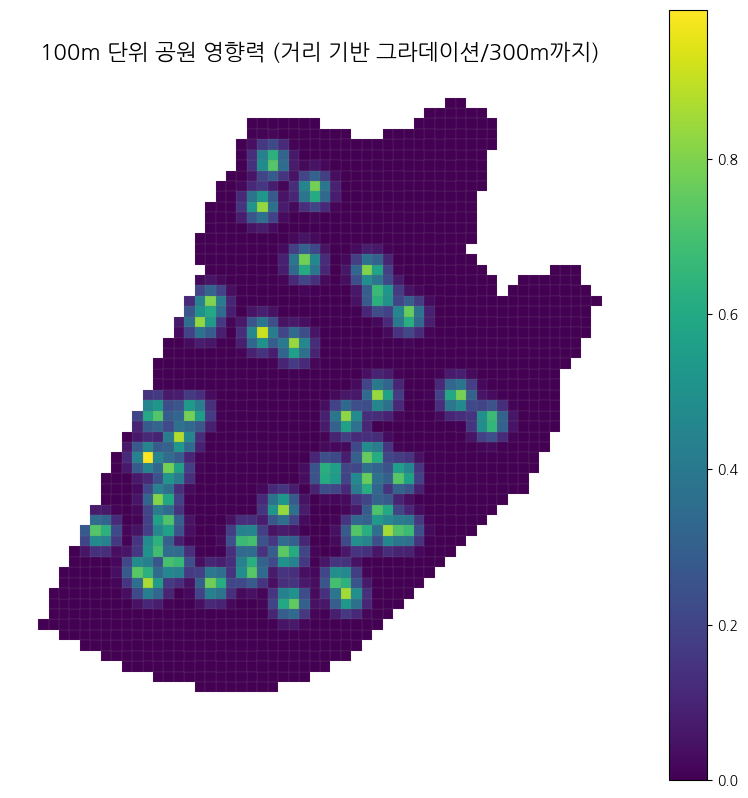

In [ ]:
# @title 어린이공원 위치 시각화(300m 그라데이션)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='child_park_score',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 공원 영향력 (거리 기반 그라데이션/300m까지)', fontsize=16)
ax.axis('off')
plt.show()


In [ ]:
# @title 유해시설
hazardous_facilities = hazardous_facilities.dropna(subset=['위도', '경도'])

# GeoDataFrame 변환
hazardous_facilities['geometry'] = hazardous_facilities.apply(
    lambda row: Point(row['경도'], row['위도']), axis=1
)
hazardous_gdf = gpd.GeoDataFrame(hazardous_facilities, geometry='geometry', crs='EPSG:4326')
hazardous_gdf = hazardous_gdf.to_crs(grid_filled.crs)

# 격자 중심 계산
grid_filled['centroid'] = grid_filled.geometry.centroid

# 거리 기반 영향력 계산
hazardous_scores = []
for _, grid_row in grid_filled.iterrows():
    max_score = 0
    for _, hazard_row in hazardous_gdf.iterrows():
        dist = grid_row['centroid'].distance(hazard_row['geometry'])
        if dist <= 300:
            score = (1 - (dist / 300)) ** 2
            max_score = max(max_score, score)
    hazardous_scores.append(max_score)

# 영향력 컬럼 저장
grid_filled['hazardous_score'] = hazardous_scores
grid_filled = grid_filled.drop(columns='centroid')


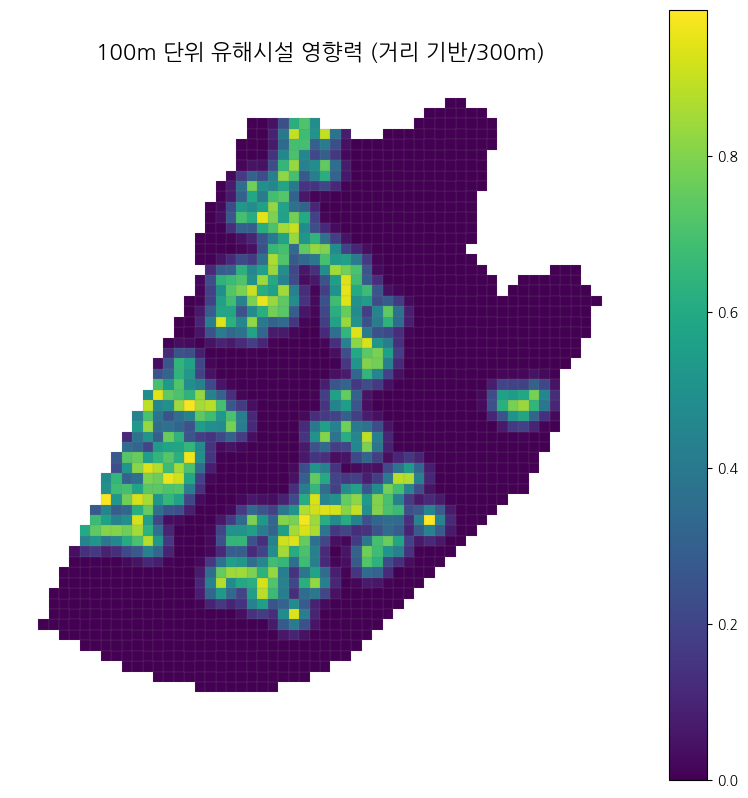

In [ ]:
# @title 유해시설 시각화

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='hazardous_score',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 유해시설 영향력 (거리 기반/300m)', fontsize=16)
ax.axis('off')
plt.show()


In [ ]:
# @title 지역아동센터

# 1. GeoDataFrame으로 변환
kid_df['geometry'] = kid_df.apply(lambda row: Point(row['경도'], row['위도']), axis=1)
kid_gdf = gpd.GeoDataFrame(kid_df, geometry='geometry', crs='EPSG:4326')
kid_gdf = kid_gdf.to_crs(grid_filled.crs)

# 2. 격자 중심 계산
grid_filled['centroid'] = grid_filled.geometry.centroid

# 3. 거리 기반 영향력 계산
kid_scores = []
for _, grid_row in grid_filled.iterrows():
    max_score = 0
    for _, kid_row in kid_gdf.iterrows():
        dist = grid_row['centroid'].distance(kid_row['geometry'])
        if dist <= 300:
            score = (1 - (dist / 300)) ** 2
            max_score = max(max_score, score)
    kid_scores.append(max_score)

# 4. 영향력 컬럼 저장
grid_filled['kid_center_score'] = kid_scores
grid_filled = grid_filled.drop(columns='centroid')


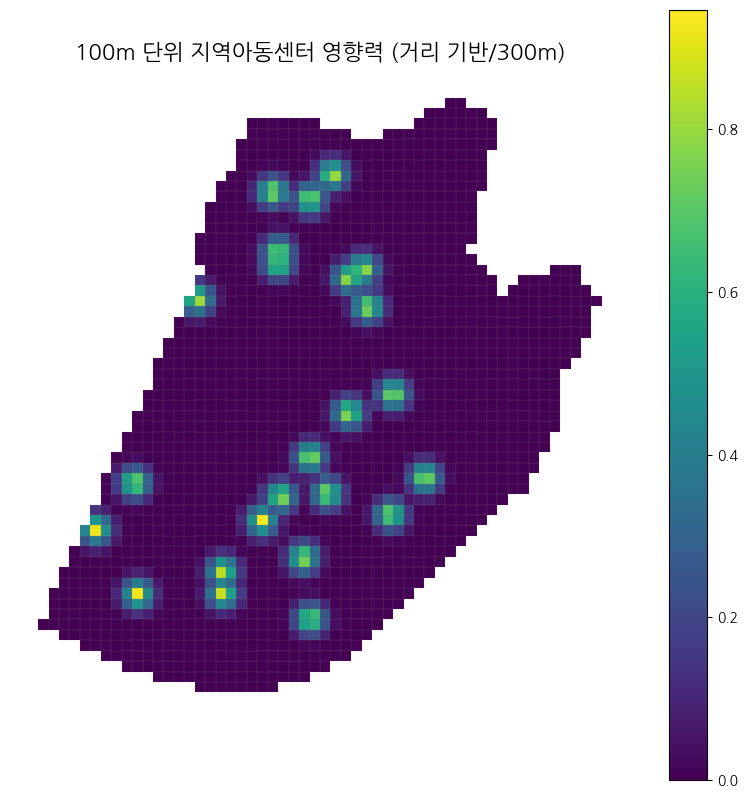

In [ ]:
# @title 지역아동센터 시각화

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='kid_center_score',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 지역아동센터 영향력 (거리 기반/300m)', fontsize=16)
ax.axis('off')
plt.show()


In [ ]:
# @title 유치원

# 1. GeoDataFrame으로 변환
kid_kindergarten_df['geometry'] = kid_kindergarten_df.apply(
    lambda row: Point(row['경도'], row['위도']), axis=1
)
kindergarten_gdf = gpd.GeoDataFrame(kid_kindergarten_df, geometry='geometry', crs='EPSG:4326')
kindergarten_gdf = kindergarten_gdf.to_crs(grid_filled.crs)

# 2. 격자 중심 계산
grid_filled['centroid'] = grid_filled.geometry.centroid

# 3. 거리 기반 영향력 계산
kindergarten_scores = []
for _, grid_row in grid_filled.iterrows():
    max_score = 0
    for _, kinder_row in kindergarten_gdf.iterrows():
        dist = grid_row['centroid'].distance(kinder_row['geometry'])
        if dist <= 300:
            score = (1 - (dist / 300)) ** 2
            max_score = max(max_score, score)
    kindergarten_scores.append(max_score)

# 4. 영향력 컬럼 저장
grid_filled['kindergarten_score'] = kindergarten_scores
grid_filled = grid_filled.drop(columns='centroid')



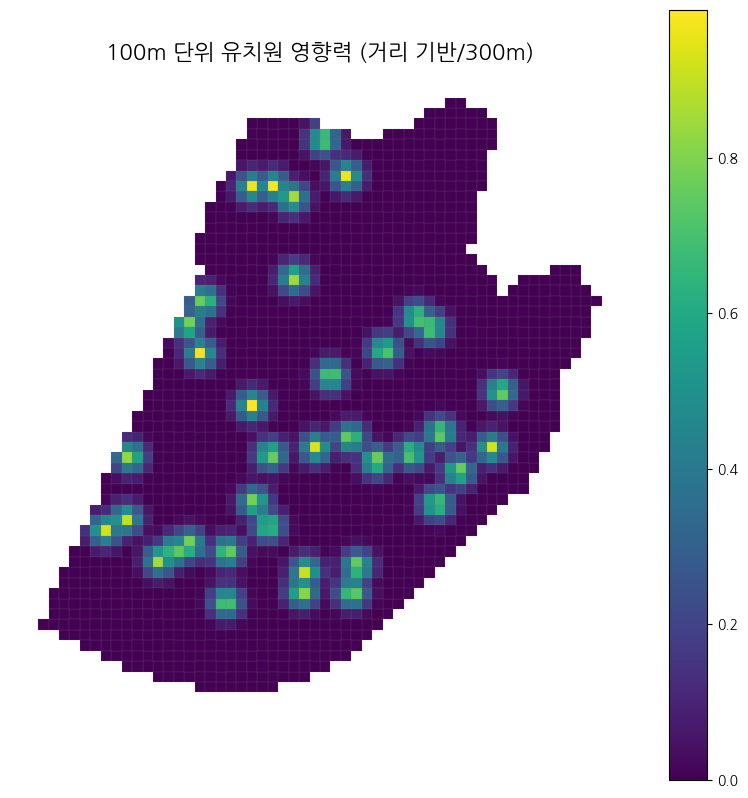

In [ ]:
# @title 유치원 시각화
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='kindergarten_score',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 유치원 영향력 (거리 기반/300m)', fontsize=16)
ax.axis('off')
plt.show()


In [ ]:
# @title 학교

# 1. GeoDataFrame으로 변환
kid_school_df['geometry'] = kid_school_df.apply(
    lambda row: Point(row['경도'], row['위도']), axis=1
)
school_gdf = gpd.GeoDataFrame(kid_school_df, geometry='geometry', crs='EPSG:4326')
school_gdf = school_gdf.to_crs(grid_filled.crs)

# 2. 격자 중심 계산
grid_filled['centroid'] = grid_filled.geometry.centroid

# 3. 거리 기반 영향력 계산
school_scores = []
for _, grid_row in grid_filled.iterrows():
    max_score = 0
    for _, school_row in school_gdf.iterrows():
        dist = grid_row['centroid'].distance(school_row['geometry'])
        if dist <= 300:
            score = (1 - (dist / 300)) ** 2
            max_score = max(max_score, score)
    school_scores.append(max_score)

# 4. 영향력 컬럼 저장
grid_filled['school_score'] = school_scores
grid_filled = grid_filled.drop(columns='centroid')


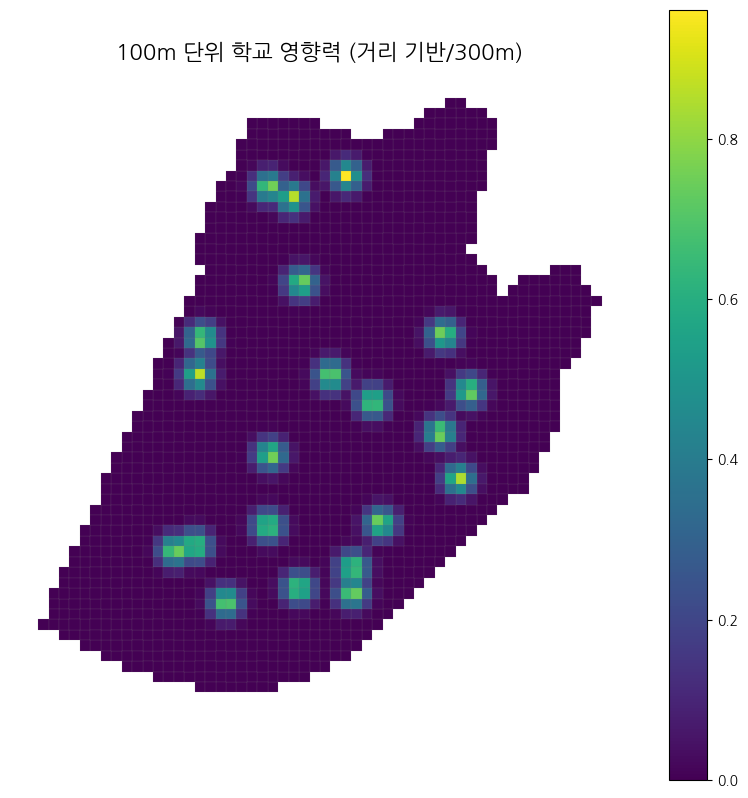

In [ ]:
# @title 학교 시각화

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='school_score',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 학교 영향력 (거리 기반/300m)', fontsize=16)
ax.axis('off')
plt.show()

In [ ]:
# @title 키즈카페

# 1. GeoDataFrame으로 변환
kid_cafe_df['geometry'] = kid_cafe_df.apply(
    lambda row: Point(row['경도'], row['위도']),
    axis=1
)
cafe_gdf = gpd.GeoDataFrame(kid_cafe_df, geometry='geometry', crs='EPSG:4326')
cafe_gdf = cafe_gdf.to_crs(grid_filled.crs)

# 2. 격자 중심 계산
grid_filled['centroid'] = grid_filled.geometry.centroid

# 3. 거리 기반 영향력 계산
cafe_scores = []
for _, grid_row in grid_filled.iterrows():
    max_score = 0
    for _, cafe_row in cafe_gdf.iterrows():
        dist = grid_row['centroid'].distance(cafe_row['geometry'])
        if dist <= 300:
            score = (1 - (dist / 300)) ** 2
            max_score = max(max_score, score)
    cafe_scores.append(max_score)

# 4. 영향력 컬럼 저장
grid_filled['kids_cafe_score'] = cafe_scores
grid_filled = grid_filled.drop(columns='centroid')


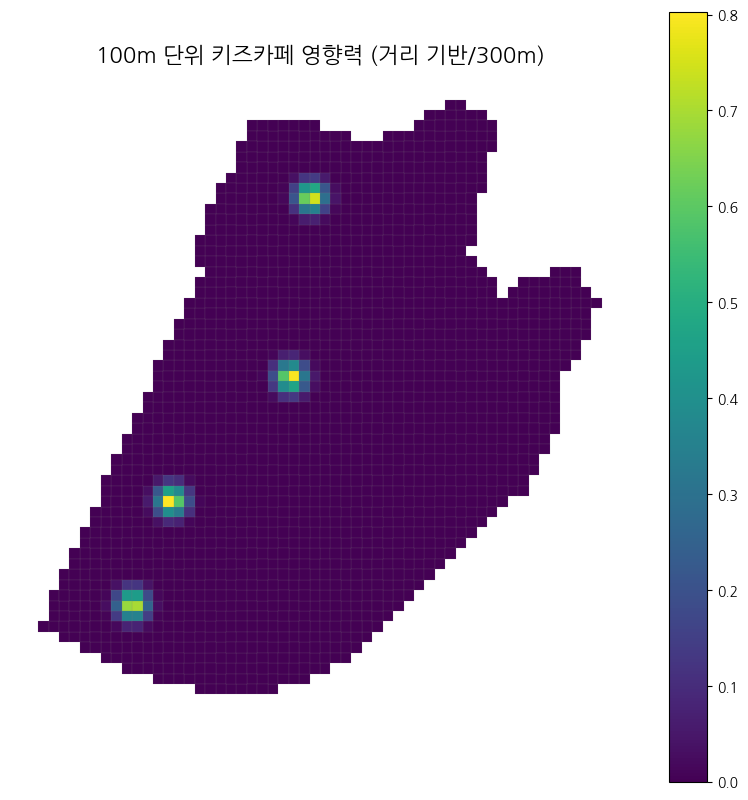

In [ ]:
# @title 키즈카페 시각화

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='kids_cafe_score',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 키즈카페 영향력 (거리 기반/300m)', fontsize=16)
ax.axis('off')
plt.show()


In [ ]:
# @title 고령자 인구
D5 = D5[['gid', 'val', 'geometry']].rename(columns={'val': 'elderly_population'})

# 좌표계 통일
D5 = D5.to_crs(grid_filled.crs)

# geometry 기준 병합
grid_filled = grid_filled.merge(D5[['gid', 'elderly_population']], on='gid', how='left')

# 결측치 0으로 채우기
grid_filled['elderly_population'] = grid_filled['elderly_population'].fillna(0)


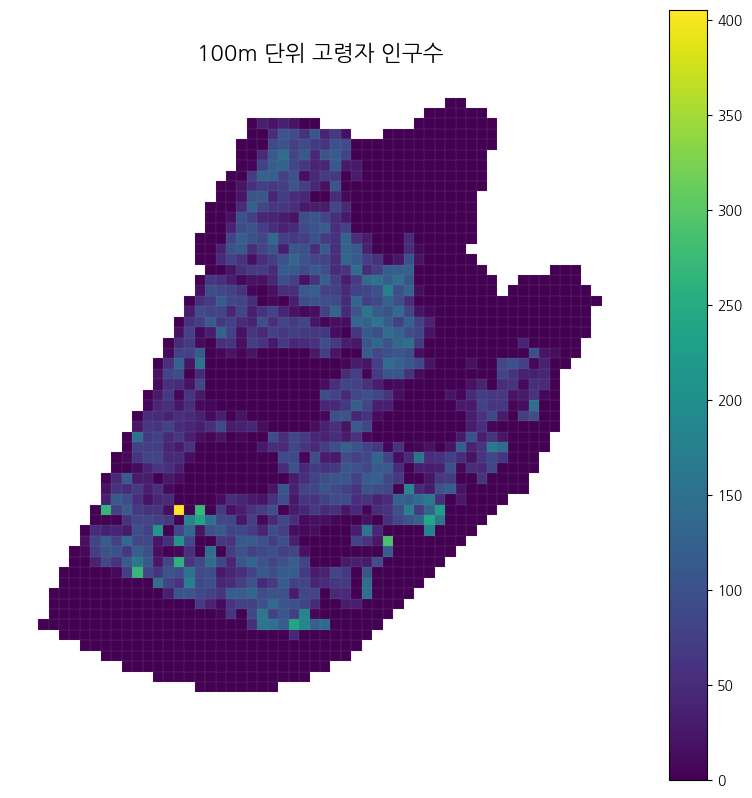

In [ ]:
# @title 고령자 인구 시각화
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='elderly_population',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 고령자 인구수', fontsize=16)
ax.axis('off')
plt.show()


In [ ]:
# @title 노인복지시설
senior_welfare_facilities = senior_welfare_facilities.dropna(subset=['위도', '경도'])

# GeoDataFrame 변환
senior_welfare_facilities['geometry'] = senior_welfare_facilities.apply(
    lambda row: Point(row['경도'], row['위도']), axis=1
)
senior_gdf = gpd.GeoDataFrame(senior_welfare_facilities, geometry='geometry', crs='EPSG:4326')
senior_gdf = senior_gdf.to_crs(grid_filled.crs)

# 격자 중심 계산
grid_filled['centroid'] = grid_filled.geometry.centroid

# 거리 기반 영향력 계산
senior_scores = []
for _, grid_row in grid_filled.iterrows():
    max_score = 0
    for _, senior_row in senior_gdf.iterrows():
        dist = grid_row['centroid'].distance(senior_row['geometry'])
        if dist <= 300:
            score = (1 - (dist / 300)) ** 2
            max_score = max(max_score, score)
    senior_scores.append(max_score)

# 결과 저장
grid_filled['senior_welfare_score'] = senior_scores
grid_filled = grid_filled.drop(columns='centroid')


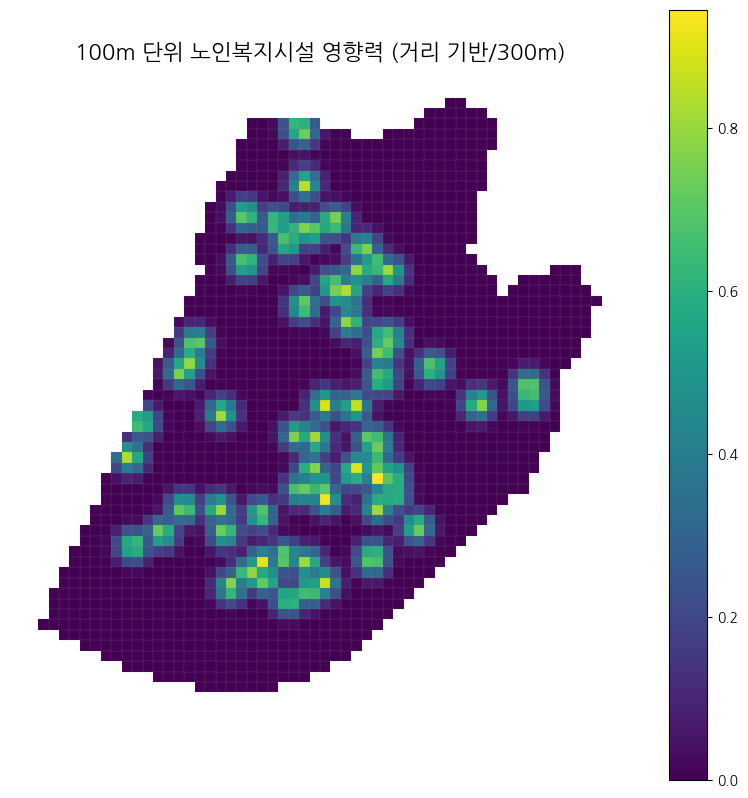

In [ ]:
# @title 노인복지시설 시각화
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='senior_welfare_score',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 노인복지시설 영향력 (거리 기반/300m)', fontsize=16)
ax.axis('off')
plt.show()

In [ ]:
# @title 공시지가

D2 = D2[['gid', 'val']].rename(columns={'val': 'land_price'})

# 병합
grid_filled = grid_filled.merge(D2, on='gid', how='left')

# 결측값 처리
grid_filled['land_price'] = grid_filled['land_price'].fillna(0)


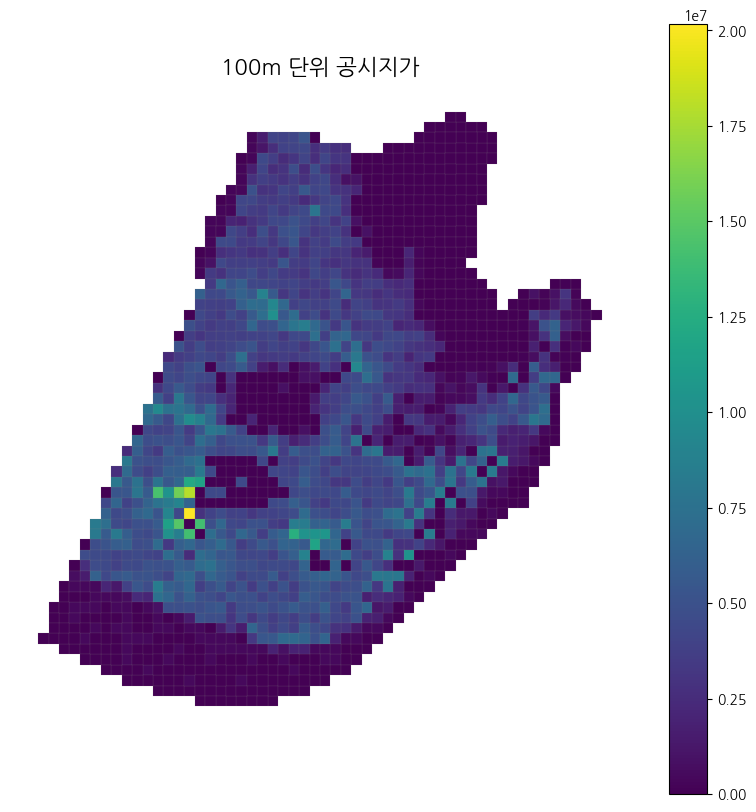

In [ ]:
# @title 공시지가 시각화

#산출방식(단위)	평균(원/㎡)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='land_price',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 공시지가', fontsize=16)
ax.axis('off')
plt.show()


In [ ]:
# @title 주차장
# NaN 제거
parking_availability = parking_availability.dropna(subset=['위도', '경도'])

# GeoDataFrame 변환
parking_availability['geometry'] = parking_availability.apply(
    lambda row: Point(row['경도'], row['위도']), axis=1
)
parking_gdf = gpd.GeoDataFrame(parking_availability, geometry='geometry', crs='EPSG:4326')
parking_gdf = parking_gdf.to_crs(grid_filled.crs)

# 격자 중심 계산
grid_filled['centroid'] = grid_filled.geometry.centroid

# 거리 기반 영향력 계산
parking_scores = []
for _, grid_row in grid_filled.iterrows():
    max_score = 0
    for _, park_row in parking_gdf.iterrows():
        dist = grid_row['centroid'].distance(park_row['geometry'])
        if dist <= 300:
            score = (1 - (dist / 300)) ** 2
            max_score = max(max_score, score)
    parking_scores.append(max_score)

# 영향력 컬럼 저장
grid_filled['parking_score'] = parking_scores
grid_filled = grid_filled.drop(columns='centroid')


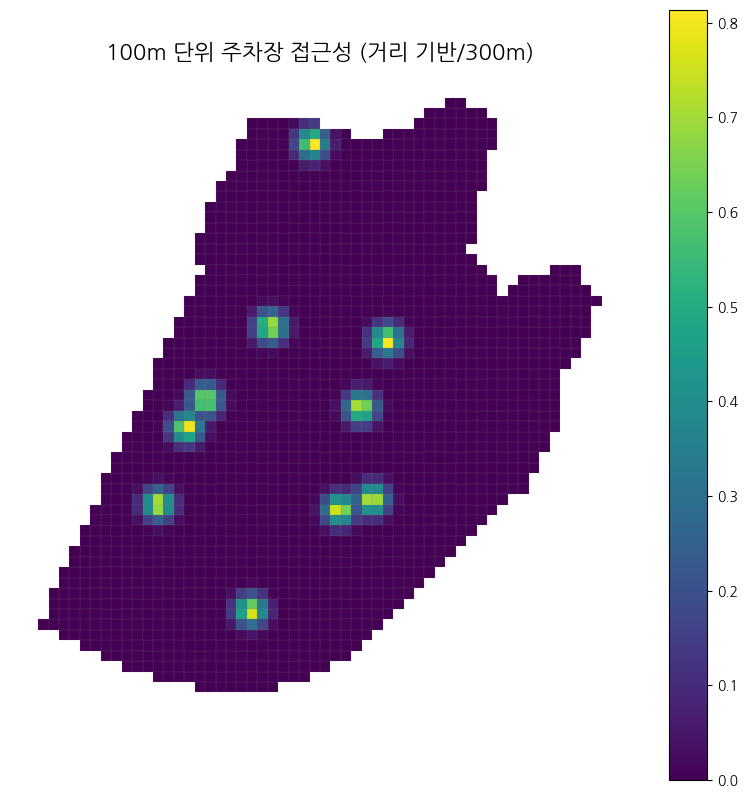

In [ ]:
# @title 주차장 시각화
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='parking_score',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 주차장 접근성 (거리 기반/300m)', fontsize=16)
ax.axis('off')
plt.show()


In [ ]:
# 1. 파일 불러오기 및 컬럼명 지정
slope_df = pd.read_csv(
    '/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/수연/광진구_DEM.txt',
    sep=' ',
    header=None,
    names=['x', 'y', 'slope']
)

# 2. GeoDataFrame 변환
slope_gdf = gpd.GeoDataFrame(
    slope_df,
    geometry=gpd.points_from_xy(slope_df['x'], slope_df['y']),
    crs='EPSG:5186'  # grid_filled와 동일한 좌표계
)

<Axes: >

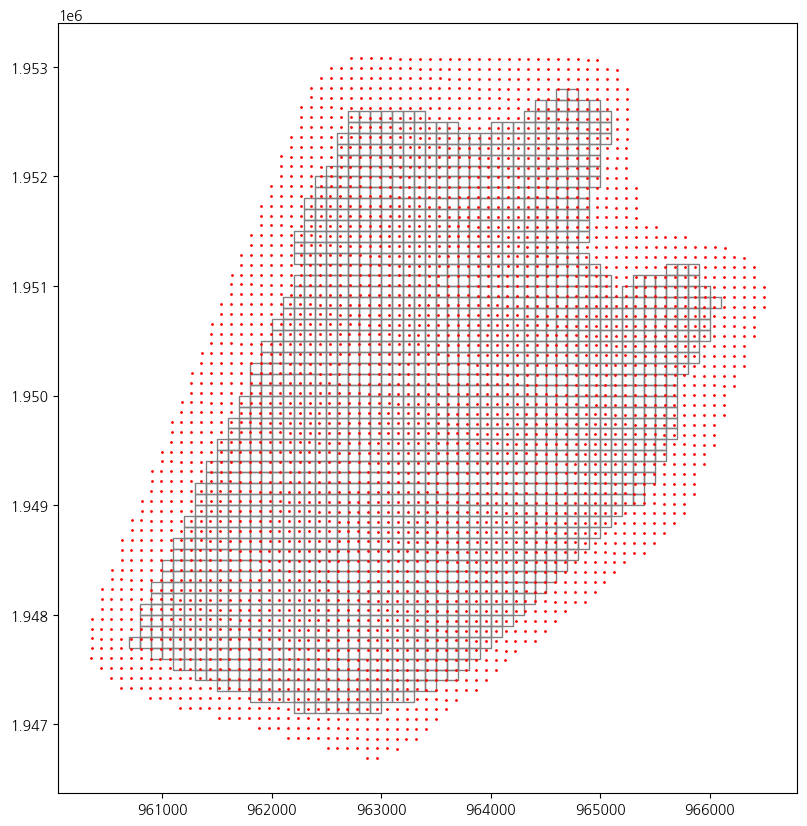

In [ ]:
# 좌표계 일치
slope_gdf = slope_gdf.to_crs(grid_filled.crs)

# (선택) 시각화로 겹치는지 확인
ax = grid_filled.plot(figsize=(10, 10), facecolor='none', edgecolor='gray')
slope_gdf.plot(ax=ax, color='red', markersize=1)


In [ ]:
# 공간 결합 (contains보다 intersects가 안정적)
joined = gpd.sjoin(grid_filled, slope_gdf, how='left', predicate='intersects')

# 격자별 평균 기울기 계산
avg_slope = joined.groupby('gid')['slope'].mean().reset_index()
avg_slope = avg_slope.rename(columns={'slope': 'avg_slope'})

# grid_filled에 병합
grid_filled = grid_filled.merge(avg_slope, on='gid', how='left')
grid_filled['avg_slope'] = grid_filled['avg_slope'].fillna(0)

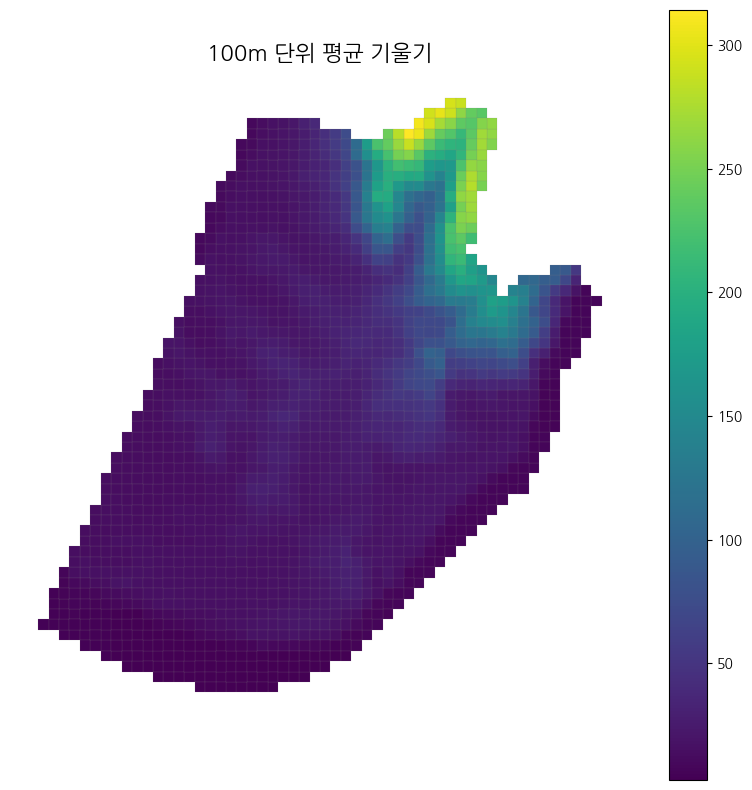

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled.plot(
    column='avg_slope',
    cmap=cmap,
    linewidth=0.1,
    edgecolor='gray',
    legend=True,
    ax=ax
)
ax.set_title('100m 단위 평균 기울기', fontsize=16)
ax.axis('off')
plt.show()


In [ ]:
grid_filled['youth_population'] = grid_filled['youth_population'].fillna(0)

In [ ]:
grid_filled.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1812 entries, 0 to 1811
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   gid                   1812 non-null   object  
 1   youth_population      1812 non-null   float64 
 2   geometry              1812 non-null   geometry
 3   park_accessibility    1812 non-null   float64 
 4   child_park_score      1812 non-null   float64 
 5   hazardous_score       1812 non-null   float64 
 6   kid_center_score      1812 non-null   float64 
 7   kindergarten_score    1812 non-null   float64 
 8   school_score          1812 non-null   float64 
 9   kids_cafe_score       1812 non-null   float64 
 10  elderly_population    1812 non-null   float64 
 11  senior_welfare_score  1812 non-null   float64 
 12  land_price            1812 non-null   float64 
 13  parking_score         1812 non-null   float64 
 14  avg_slope             1812 non-null   float64 
d

In [ ]:
grid_filled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1812 entries, 0 to 1811
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   gid         1812 non-null   object
 1   youth_popu  1812 non-null   object
 2   park_acces  1812 non-null   object
 3   child_park  1812 non-null   object
 4   hazardous_  1812 non-null   object
 5   kid_center  1812 non-null   object
 6   kindergart  1812 non-null   object
 7   school_sco  1812 non-null   object
 8   kids_cafe_  1812 non-null   object
 9   elderly_po  1812 non-null   object
 10  senior_wel  1812 non-null   object
 11  land_price  1812 non-null   object
 12  parking_sc  1812 non-null   object
 13  avg_slope   1812 non-null   object
 14  geometry    1812 non-null   object
dtypes: object(15)
memory usage: 212.5+ KB


## 정규화

In [ ]:
# prompt: /content/drive/MyDrive/공모전/광진구 공모전 데이터/최종_예측용_데이터_정규화_끝.csv 이거를 grid_filled 로 불러올래

grid_filled = gpd.read_file('/content/drive/MyDrive/공모전/광진구 공모전 데이터/최종_예측용_데이터_정규화_끝.csv')


In [ ]:
# 컬럼 이름 변경 딕셔너리 생성
new_column_names = {
    'youth_popu': 'youth_population',
    'child_park': 'child_park_score', # child_park를 child_park_score로 변경
    'hazardous_': 'hazardous_score',
    'kid_center': 'kid_center_score',
    'kindergart': 'kindergarten_score',
    'school_sco': 'school_score',
    'kids_cafe_': 'kids_cafe_score',
    'elderly_po': 'elderly_population',
    'senior_wel': 'senior_welfare_score',
    'land_price': 'land_price',
    'parking_sc': 'parking_score'
}


# 컬럼 이름 변경
grid_filled = grid_filled.rename(columns=new_column_names)

grid_filled['gid'] = grid_filled['gid'].astype('object')
grid_filled['geometry'] = grid_filled['geometry'].astype('object')
grid_filled['youth_population'] = grid_filled['youth_population'].astype('float')
grid_filled['park_acces'] = grid_filled['park_acces'].astype('float')
grid_filled['child_park_score'] = grid_filled['child_park_score'].astype('float')
grid_filled['hazardous_score'] = grid_filled['hazardous_score'].astype('float')
grid_filled['kid_center_score'] = grid_filled['kid_center_score'].astype('float')
grid_filled['kindergarten_score'] = grid_filled['kindergarten_score'].astype('float')
grid_filled['school_score'] = grid_filled['school_score'].astype('float')
grid_filled['kids_cafe_score'] = grid_filled['kids_cafe_score'].astype('float')
grid_filled['elderly_population'] = grid_filled['elderly_population'].astype('float')
grid_filled['senior_welfare_score'] = grid_filled['senior_welfare_score'].astype('float')
grid_filled['land_price'] = grid_filled['land_price'].astype('float')
grid_filled['parking_score'] = grid_filled['parking_score'].astype('float')
grid_filled['avg_slope'] = grid_filled['avg_slope'].astype('float')


# 변경된 컬럼 확인 (선택)
grid_filled.columns


Index(['gid', 'youth_population', 'park_acces', 'child_park_score',
       'hazardous_score', 'kid_center_score', 'kindergarten_score',
       'school_score', 'kids_cafe_score', 'elderly_population',
       'senior_welfare_score', 'land_price', 'parking_score', 'avg_slope',
       'geometry'],
      dtype='object')

In [ ]:
grid_filled = grid_filled.drop(columns=['park_acces'])

In [ ]:
grid_filled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1812 entries, 0 to 1811
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   gid                   1812 non-null   object 
 1   youth_population      1812 non-null   float64
 2   child_park_score      1812 non-null   float64
 3   hazardous_score       1812 non-null   float64
 4   kid_center_score      1812 non-null   float64
 5   kindergarten_score    1812 non-null   float64
 6   school_score          1812 non-null   float64
 7   kids_cafe_score       1812 non-null   float64
 8   elderly_population    1812 non-null   float64
 9   senior_welfare_score  1812 non-null   float64
 10  land_price            1812 non-null   float64
 11  parking_score         1812 non-null   float64
 12  avg_slope             1812 non-null   float64
 13  geometry              1812 non-null   object 
dtypes: float64(12), object(2)
memory usage: 198.3+ KB


In [ ]:
normal_cols = [
    'youth_population',
    'kid_center_score',
    'kindergarten_score',
    'school_score',
    'kids_cafe_score',
    'elderly_population',
    'senior_welfare_score',
    'parking_score'
]

reverse_cols = ['child_park_score','hazardous_score', 'land_price', 'avg_slope']


In [ ]:
# @title 정규화, 역정규화

from sklearn.preprocessing import MinMaxScaler

# 복사본 생성
grid_filled_norm = grid_filled.copy()

# 일반 정규화
scaler = MinMaxScaler()
grid_filled_norm[normal_cols] = scaler.fit_transform(grid_filled[normal_cols])

# 역방향 정규화: 1 - MinMax
for col in reverse_cols:
    min_val = grid_filled[col].min()
    max_val = grid_filled[col].max()
    grid_filled_norm[col] = 1 - (grid_filled[col] - min_val) / (max_val - min_val)


In [ ]:
# @title 쌍대비교, AHP분석
criteria = [
    'youth_population', 'child_park_score', 'hazardous_score', 'avg_slope',
    'kid_center_score', 'kindergarten_score', 'school_score', 'kids_cafe_score',
    'elderly_population', 'senior_welfare_score', 'land_price', 'parking_score'
]
importance = [1, 2, 2, 3, 3, 4, 4, 5, 6, 6, 7, 7]

n = len(criteria)
comparison_matrix = np.ones((n, n))

# 중요도 차이에 따라 쌍대비교값 채우기
for i in range(n):
    for j in range(n):
        diff = importance[i] - importance[j]
        if diff == 0:
            comparison_matrix[i, j] = 1
        elif diff > 0:
            comparison_matrix[i, j] = 1 / (abs(diff) + 1)
        else:
            comparison_matrix[i, j] = (abs(diff) + 1)

# AHP 계산
eigenvalues, eigenvectors = np.linalg.eig(comparison_matrix)
max_index = np.argmax(eigenvalues.real)
principal_eigenvector = eigenvectors[:, max_index].real
weights = principal_eigenvector / principal_eigenvector.sum()

# 일관성 비율 계산
lambda_max = eigenvalues[max_index].real
CI = (lambda_max - n) / (n - 1)
RI_dict = {1: 0.00, 2: 0.00, 3: 0.58, 4: 0.90, 5: 1.12, 6: 1.24, 7: 1.32, 8: 1.41,
           9: 1.45, 10: 1.49, 11: 1.51, 12: 1.48, 13: 1.56, 14: 1.57, 15: 1.59}
RI = RI_dict.get(n, 1.59)
CR = CI / RI if RI != 0 else 0

# 결과 정리
weights_df = pd.DataFrame({
    'criterion': criteria,
    'weight': weights
}).sort_values(by='weight', ascending=False).reset_index(drop=True)

print(f"λ_max: {lambda_max:.4f}")
print(f"CI: {CI:.4f}")
print(f"CR: {CR:.4f}")
if CR < 0.1:
    print("→ 일관성 있음 (CR < 0.1)")
else:
    print("→ 일관성 부족 (CR ≥ 0.1)")

λ_max: 12.3113
CI: 0.0283
CR: 0.0191
→ 일관성 있음 (CR < 0.1)


In [ ]:
weights_df[weights_df['criterion'] == 'youth_population']


,criterion,weight
0,youth_population,0.225696


In [ ]:
# @title AHP 유효 판단
"""
개념	설명
λ<sub>max</sub>	쌍대비교 행렬의 최대 고유값
CI (Consistency Index)	CI = (λ<sub>max</sub> - n) / (n - 1)
RI (Random Index)	항목 수 n에 따른 무작위 행렬의 일관성 기대값
CR (Consistency Ratio)	CR = CI / RI → 이게 핵심

항목 수 n = 13

계산된 CR = 0.0167

🔍 → CR이 0.1보다 훨씬 작기 때문에,
👉 이 쌍대비교표는 논리적 일관성이 매우 높고, 결과는 신뢰할 수 있음
"""

'\n개념\t설명\nλ<sub>max</sub>\t쌍대비교 행렬의 최대 고유값\nCI (Consistency Index)\tCI = (λ<sub>max</sub> - n) / (n - 1)\nRI (Random Index)\t항목 수 n에 따른 무작위 행렬의 일관성 기대값\nCR (Consistency Ratio)\tCR = CI / RI → 이게 핵심\n\n항목 수 n = 13\n\n계산된 CR = 0.0167\n\n🔍 → CR이 0.1보다 훨씬 작기 때문에,\n👉 이 쌍대비교표는 논리적 일관성이 매우 높고, 결과는 신뢰할 수 있음\n'

importance (중요도) 리스트를 기준으로 쌍대비교표(comparison matrix)를 만듦.

→ 기준끼리 중요도 차이에 따라 1, 2, 1/2 이런 식으로 값을 설정함.

이 쌍대비교표의 최대 고유값(λ_max) 을 찾음.

그 고유벡터를 정규화해서 (합이 1이 되게) 가중치(weight) 를 계산.


이 과정을 통해 나온 가중치가 아까 보여준 표야.

In [ ]:
grid_filled_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1812 entries, 0 to 1811
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   gid                   1812 non-null   object 
 1   youth_population      1812 non-null   float64
 2   child_park_score      1812 non-null   float64
 3   hazardous_score       1812 non-null   float64
 4   kid_center_score      1812 non-null   float64
 5   kindergarten_score    1812 non-null   float64
 6   school_score          1812 non-null   float64
 7   kids_cafe_score       1812 non-null   float64
 8   elderly_population    1812 non-null   float64
 9   senior_welfare_score  1812 non-null   float64
 10  land_price            1812 non-null   float64
 11  parking_score         1812 non-null   float64
 12  avg_slope             1812 non-null   float64
 13  geometry              1812 non-null   object 
dtypes: float64(12), object(2)
memory usage: 198.3+ KB


In [ ]:
weights_dict = {
    'youth_population': 0.225696,
    'child_park_score': 0.1696,
    'hazardous_score': 0.1696,
    'avg_slope': 0.1395,
    'kid_center_score': 0.1395,
    'kindergarten_score': 0.1123,
    'school_score': 0.1123,
    'kids_cafe_score': 0.0870,
    'elderly_population': 0.0636,
    'senior_welfare_score': 0.0494,
    'land_price': 0.0494,
    'parking_score': 0.0494
}

# 계산: 각 변수 × 가중치
grid_filled_norm['total_score'] = 0  # 일단 total_score 컬럼 초기화

for col, weight in weights_dict.items():
    grid_filled_norm['total_score'] += grid_filled[col] * weight

# 결과 확인
grid_filled_norm[['gid', 'total_score']].sort_values(by='total_score', ascending=False).head(10)

,gid,total_score
966,다사621489,996240.403805
1152,다사621491,884302.676831
1201,다사620491,780385.119177
870,다사620488,732447.711828
1187,다사618491,704449.591344
123,다사622488,693595.480347
216,다사621487,693591.533722
359,다사631487,627849.069882
1030,다사621492,604097.587281
81,다사633486,582506.895000


AttributeError: Line2D.set() got an unexpected keyword argument 'edgecolor'

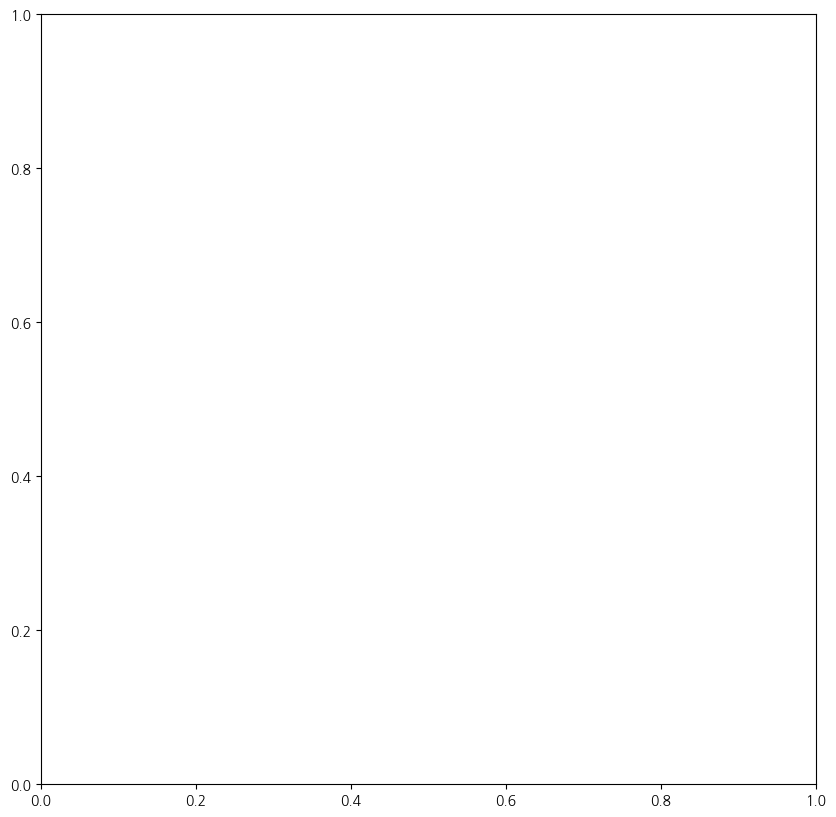

In [ ]:
# @title 상위 15개 추출 후 시각화
top15 = grid_filled_norm.nlargest(15, 'total_score')

# 6. 시각화
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
grid_filled_norm.plot(ax=ax, column='total_score', cmap='viridis', legend=True, edgecolor='gray', linewidth=0.1)
top15.boundary.plot(ax=ax, color='red', linewidth=1)
ax.set_title('어린이공원 후보지 상위 15개 지역 (총합 점수 기준)', fontsize=14)
ax.axis('off')
plt.show()

In [ ]:
grid_filled_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1812 entries, 0 to 1811
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   gid                   1812 non-null   object 
 1   youth_population      1812 non-null   float64
 2   child_park_score      1812 non-null   float64
 3   hazardous_score       1812 non-null   float64
 4   kid_center_score      1812 non-null   float64
 5   kindergarten_score    1812 non-null   float64
 6   school_score          1812 non-null   float64
 7   kids_cafe_score       1812 non-null   float64
 8   elderly_population    1812 non-null   float64
 9   senior_welfare_score  1812 non-null   float64
 10  land_price            1812 non-null   float64
 11  parking_score         1812 non-null   float64
 12  avg_slope             1812 non-null   float64
 13  geometry              1812 non-null   object 
 14  total_score           1812 non-null   float64
dtypes: float64(13), objec

In [ ]:
import geopandas as gpd
from shapely import wkt

# 문자열로 저장된 geometry 컬럼을 실제 Geometry 객체로 변환 (필요한 경우)
grid_filled_norm['geometry'] = grid_filled_norm['geometry'].apply(wkt.loads)

# GeoDataFrame으로 변환
grid_filled_norm = gpd.GeoDataFrame(grid_filled_norm, geometry='geometry', crs='EPSG:5179')  # 보통 서울시 좌표계는 EPSG:5179

# EPSG:4326으로 좌표계 변환
grid_filled_norm = grid_filled_norm.to_crs(epsg=4326)

top15 = grid_filled_norm.nlargest(180, 'total_score').copy()  # 혹시 누락되었을 경우 다시 지정

# 2. 지도 중심점 지정 (광진구 중앙 정도)
map_center = [37.545, 127.085]
m = folium.Map(location=map_center, zoom_start=14, tiles='cartodbpositron')

# 3. 전체 그리드 배경 (밝은 회색)
folium.GeoJson(
    grid_filled_norm,
    style_function=lambda x: {
        'fillColor': '#000000',
        'color': 'gray',
        'weight': 0.2,
        'fillOpacity': 0.05,
    }
).add_to(m)

# 4. 상위 15개 그리드 강조 (진한 빨간색)
for _, row in top15.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda x: {
            'fillColor': 'red',
            'color': 'red',
            'weight': 1,
            'fillOpacity': 0.6,
        }
    ).add_to(m)

# 5. 지도 출력
m

TypeError: Expected bytes or string, got Polygon

In [ ]:
import folium
from folium import GeoJson

# 점수 정규화 → 투명도 설정용
score_min = top15['total_score'].min()
score_max = top15['total_score'].max()
top15['opacity'] = top15['total_score'].apply(lambda x: 0.3 + 0.7 * ((x - score_min) / (score_max - score_min)))

# 순위 추가
top15 = top15.copy()
top15['rank'] = top15['total_score'].rank(method='first', ascending=False).astype(int)

# 지도 생성
map_center = [37.545, 127.085]
m = folium.Map(location=map_center, zoom_start=14, tiles='cartodbpositron')

# 전체 격자 배경
folium.GeoJson(
    grid_filled_norm,
    style_function=lambda x: {
        'fillColor': '#000000',
        'color': 'gray',
        'weight': 0.2,
        'fillOpacity': 0.05,
    }
).add_to(m)

# 상위 15개만 점수 기반 진하게 표시 + 팝업 추가
for _, row in top15.iterrows():
    g = folium.GeoJson(
        row['geometry'],
        style_function=lambda x, op=row['opacity']: {
            'fillColor': 'red',
            'color': 'red',
            'weight': 1,
            'fillOpacity': op,
        }
    )
    folium.Popup(
        f"순위: {row['rank']}위<br>"
        f"gid: {row['gid']}<br>"
        f"total_score: {row['total_score']:.4f}"
    ).add_to(g)
    g.add_to(m)

# 지도 출력
m


In [ ]:
top15 = grid_filled_norm.nlargest(180, 'total_score').copy()  # 혹시 누락되었을 경우 다시 지정

# 점수 정규화 → 투명도 설정용
score_min = top15['total_score'].min()
score_max = top15['total_score'].max()
top15['opacity'] = top15['total_score'].apply(lambda x: 0.3 + 0.7 * ((x - score_min) / (score_max - score_min)))

# 순위 추가
top15 = top15.copy()
top15['rank'] = top15['total_score'].rank(method='first', ascending=False).astype(int)

# 지도 생성
map_center = [37.545, 127.085]
m = folium.Map(location=map_center, zoom_start=14, tiles='cartodbpositron')

# 전체 격자 배경
folium.GeoJson(
    grid_filled_norm,
    style_function=lambda x: {
        'fillColor': '#000000',
        'color': 'gray',
        'weight': 0.2,
        'fillOpacity': 0.05,
    }
).add_to(m)

# 상위 15개만 점수 기반 진하게 표시 + 팝업 추가
for _, row in top15.iterrows():
    g = folium.GeoJson(
        row['geometry'],
        style_function=lambda x, op=row['opacity']: {
            'fillColor': 'red',
            'color': 'red',
            'weight': 1,
            'fillOpacity': op,
        }
    )
    folium.Popup(
        f"순위: {row['rank']}위<br>"
        f"gid: {row['gid']}<br>"
        f"total_score: {row['total_score']:.4f}"
    ).add_to(g)
    g.add_to(m)

# 지도 출력
m

In [ ]:
top15

,gid,youth_population,child_park_score,hazardous_score,kid_center_score,kindergarten_score,school_score,kids_cafe_score,elderly_population,senior_welfare_score,land_price,parking_score,avg_slope,geometry,total_score,opacity,rank
966,다사621489,0.000000,0.989699,0.796556,0.000000,0.000000,0.000000,0.234126,0.000000,0.474569,0.000000,0.000000,0.962563,"POLYGON ((127.071 37.53864, 127.07099 37.53954...",996240.403805,1.000000,1
1152,다사621491,0.000000,0.863153,0.403811,0.000000,0.000000,0.000000,0.026311,0.000000,0.002036,0.112360,0.000000,0.963076,"POLYGON ((127.07099 37.54045, 127.07098 37.541...",884302.676831,0.887182,2
1201,다사620491,0.000000,0.583691,0.072917,0.000000,0.000000,0.000000,0.126459,0.032099,0.002857,0.216671,0.000000,0.964776,"POLYGON ((127.06986 37.54044, 127.06985 37.541...",780385.119177,0.782447,3
870,다사620488,0.000000,0.858361,0.762178,0.000000,0.000000,0.000000,0.407395,1.000000,0.752692,0.264815,0.120147,0.960702,"POLYGON ((127.06987 37.53774, 127.06987 37.538...",732447.711828,0.734132,4
1187,다사618491,0.000000,0.750067,0.223102,0.051471,0.000000,0.000000,0.063783,0.000000,0.000000,0.292893,0.036665,0.965001,"POLYGON ((127.06759 37.54043, 127.06759 37.541...",704449.591344,0.705914,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,다사613489,0.000000,1.000000,0.010676,0.000000,0.011918,0.000000,0.000000,0.083951,0.000000,0.693596,0.000000,0.962691,"POLYGON ((127.06194 37.53861, 127.06194 37.539...",305255.815960,0.303580,176
582,다사633488,0.000000,1.000000,0.070321,0.123104,0.000000,0.000000,0.000000,0.170370,0.257273,0.694903,0.049264,0.950565,"POLYGON ((127.08459 37.53779, 127.08458 37.538...",303956.308370,0.302270,177
596,다사619482,0.291304,0.542695,1.000000,0.000000,0.262247,0.075687,0.000000,0.251852,0.000000,0.696371,0.000000,0.958841,"POLYGON ((127.06877 37.53233, 127.06877 37.533...",302495.124559,0.300797,178
23,다사626509,0.043478,1.000000,0.200808,0.000000,0.000000,0.000000,0.000000,0.148148,0.010620,0.697119,0.000000,0.955826,"POLYGON ((127.07656 37.55669, 127.07655 37.557...",301747.862961,0.300044,179


In [ ]:
import folium
from folium import GeoJson

# 1. 좌표계 변환 (EPSG:4326 → 위경도)
grid_filled_norm = grid_filled_norm.to_crs(epsg=4326)

# 2. 상위 100개 추출
top100 = grid_filled_norm.nlargest(100, 'total_score').copy()

# 3. 점수 정규화 → 투명도 설정용
score_min = top100['total_score'].min()
score_max = top100['total_score'].max()
top100['opacity'] = top100['total_score'].apply(lambda x: 0.3 + 0.7 * ((x - score_min) / (score_max - score_min)))

# 4. 순위 추가
top100['rank'] = top100['total_score'].rank(method='first', ascending=False).astype(int)

# 5. 지도 생성
map_center = [37.545, 127.085]
m = folium.Map(location=map_center, zoom_start=14, tiles='cartodbpositron')

# 6. 전체 그리드 배경 (밝은 회색)
folium.GeoJson(
    grid_filled_norm,
    style_function=lambda x: {
        'fillColor': '#000000',
        'color': 'gray',
        'weight': 0.2,
        'fillOpacity': 0.05,
    }
).add_to(m)

# 7. 상위 100개 점수 기반 진하게 표시 + 팝업 추가
for _, row in top100.iterrows():
    g = folium.GeoJson(
        row['geometry'],
        style_function=lambda x, op=row['opacity']: {
            'fillColor': 'red',
            'color': 'red',
            'weight': 1,
            'fillOpacity': op,
        }
    )
    folium.Popup(
        f"순위: {row['rank']}위<br>"
        f"gid: {row['gid']}<br>"
        f"total_score: {row['total_score']:.4f}"
    ).add_to(g)
    g.add_to(m)

# 8. 지도 출력
m


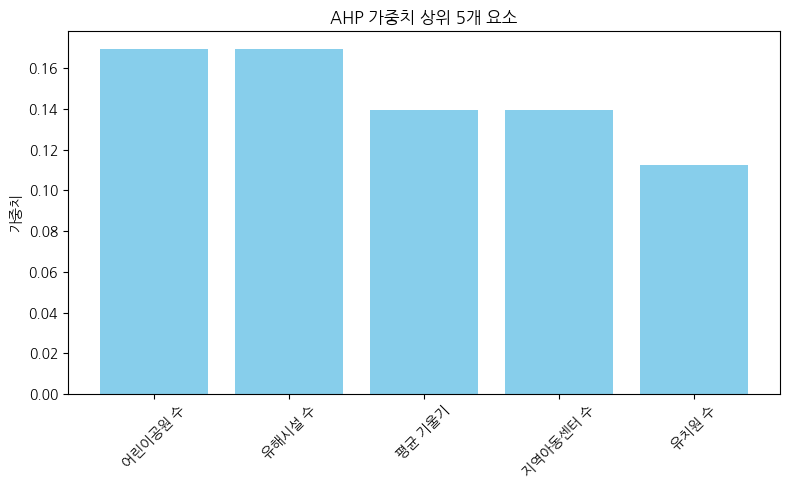

In [ ]:
import matplotlib.pyplot as plt

# AHP 가중치 상위 5개만 추출
weights_dict = {
    'child_park_score': 0.1696,
    'hazardous_score': 0.1696,
    'avg_slope': 0.1395,
    'kid_center_score': 0.1395,
    'kindergarten_score': 0.1123,
    'school_score': 0.1123,
    'kids_cafe_score': 0.0870,
    'elderly_population': 0.0636,
    'senior_welfare_score': 0.0494,
    'land_price': 0.0494,
    'parking_score': 0.0494
}

# 한글 이름으로 매핑
korean_labels = {
    'child_park_score': '어린이공원 수',
    'hazardous_score': '유해시설 수',
    'avg_slope': '평균 기울기',
    'kid_center_score': '지역아동센터 수',
    'kindergarten_score': '유치원 수',
    'school_score': '초등학교 수',
    'kids_cafe_score': '키즈카페 수',
    'elderly_population': '노인 인구수',
    'senior_welfare_score': '노인복지시설 수',
    'land_price': '평당 땅값',
    'parking_score': '공영주차장 수'
}

# 상위 5개만 선택
top_5 = dict(sorted(weights_dict.items(), key=lambda item: item[1], reverse=True)[:5])
top_5_kor = {korean_labels[k]: v for k, v in top_5.items()}

# 시각화
plt.figure(figsize=(8, 5))
plt.bar(top_5_kor.keys(), top_5_kor.values(), color='skyblue')
plt.ylabel('가중치')
plt.title('AHP 가중치 상위 5개 요소')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
map_center = [37.545, 127.085]
m = folium.Map(location=map_center, zoom_start=14, tiles='cartodbpositron')

# 6. 전체 그리드 배경 (밝은 회색)
folium.GeoJson(
    grid_filled_norm,
    style_function=lambda x: {
        'fillColor': '#000000',
        'color': 'gray',
        'weight': 0.2,
        'fillOpacity': 0.05,
    }
).add_to(m)

m

# 수연님 시각화

In [ ]:
df_predict_copy = pd.read_csv('/content/drive/MyDrive/공모전/광진구 공모전 데이터/db/df_predict.csv')

In [ ]:
import geopandas as gpd
from shapely import wkt

# 2. geometry 컬럼을 WKT에서 shapely 객체로 변환
df_predict_copy['geometry'] = df_predict_copy['geometry'].apply(wkt.loads)

# 3. GeoDataFrame 변환 (EPSG:5186로 초기 설정)
gdf_predict_copy = gpd.GeoDataFrame(df_predict_copy, geometry='geometry', crs='EPSG:5179')

# 4. 위경도 좌표계(EPSG:4326)로 변환
gdf_predict_copy = gdf_predict_copy.to_crs(epsg=4326)

# 5. 결과 출력 (첫 1개만)
print(gdf_predict_copy[['gid', 'geometry']].head(1))


        gid                                           geometry
0  다사633494  POLYGON ((127.08456 37.5432, 127.08455 37.5441...


In [ ]:
import folium

# 1. 상위 100개 추출
top100 = gdf_predict_copy.nlargest(180, '가중합_점수').copy()

# 2. 점수 정규화 → 투명도 설정
score_min = top100['가중합_점수'].min()
score_max = top100['가중합_점수'].max()
top100['opacity'] = top100['가중합_점수'].apply(lambda x: 0.3 + 0.7 * ((x - score_min) / (score_max - score_min)))

# 3. 순위 추가
top100['rank'] = top100['가중합_점수'].rank(method='first', ascending=False).astype(int)

# 4. 지도 생성 (광진구 중심)
map_center = [37.545, 127.085]
m = folium.Map(location=map_center, zoom_start=14, tiles='cartodbpositron')

# 5. 전체 배경 격자 얇게 표시
folium.GeoJson(
    gdf_predict_copy,
    style_function=lambda x: {
        'fillColor': '#000000',
        'color': 'gray',
        'weight': 0.2,
        'fillOpacity': 0.05,
    }
).add_to(m)

# 6. 상위 100개 진하게 표시 + 팝업
for _, row in top100.iterrows():
    g = folium.GeoJson(
        row['geometry'],
        style_function=lambda x, op=row['opacity']: {
            'fillColor': 'red',
            'color': 'red',
            'weight': 1,
            'fillOpacity': op,
        }
    )
    folium.Popup(
        f"순위: {row['rank']}위<br>"
        f"gid: {row['gid']}<br>"
        f"가중합 점수: {row['가중합_점수']:.2f}"
    ).add_to(g)
    g.add_to(m)

# 7. 지도 출력
m


In [ ]:
import folium

# 1. 상위 100개 추출
top200 = gdf_predict_copy.nlargest(180, '가중합_점수').copy()

# 2. 점수 정규화 → 투명도 설정
score_min = top200['가중합_점수'].min()
score_max = top200['가중합_점수'].max()
top200['opacity'] = top200['가중합_점수'].apply(lambda x: 0.3 + 0.7 * ((x - score_min) / (score_max - score_min)))

# 3. 순위 추가
top200['rank'] = top200['가중합_점수'].rank(method='first', ascending=False).astype(int)

# 4. 지도 생성 (광진구 중심)
map_center = [37.545, 127.085]
m = folium.Map(location=map_center, zoom_start=14, tiles='cartodbpositron')

# 5. 전체 배경 격자 얇게 표시
folium.GeoJson(
    gdf_predict_copy,
    style_function=lambda x: {
        'fillColor': '#000000',
        'color': 'gray',
        'weight': 0.2,
        'fillOpacity': 0.05,
    }
).add_to(m)

# 6. 상위 100개 진하게 표시 + 팝업
for _, row in top200.iterrows():
    g = folium.GeoJson(
        row['geometry'],
        style_function=lambda x, op=row['opacity']: {
            'fillColor': 'green',
            'color': 'green',
            'weight': 1,
            'fillOpacity': op,
        }
    )
    folium.Popup(
        f"순위: {row['rank']}위<br>"
        f"gid: {row['gid']}<br>"
        f"가중합 점수: {row['가중합_점수']:.2f}"
    ).add_to(g)
    g.add_to(m)

# 7. 지도 출력
m


In [ ]:
top100.head()

,gid,geometry,초등학교_수,유치원_수,지역아동센터_수,키즈카페_수,청소년유해업소_수,공영주차장_수,노인복지시설_수,공시지가,유소년_인구수,노인_인구수,인근공원_수,평균_기울기,어린이공원_설치_예측,설치_필요_확률,가중합_점수,합성_스코어,opacity,rank
966,다사621489,"POLYGON ((127.071 37.53864, 127.07099 37.53954...",0.0,0.0,0.000000,0.187915,0.200811,0.000000,0.448366,20166767.88,0.0,0.0,0.899,14.31,1,0.913438,1.278556e+06,639278.694622,1.000000,1
1152,다사621491,"POLYGON ((127.07099 37.54045, 127.07098 37.541...",0.0,0.0,0.000000,0.021118,0.588473,0.000000,0.001924,17900821.42,0.0,0.0,0.310,14.15,1,0.922427,1.134897e+06,567449.151842,0.887182,2
1201,다사620491,"POLYGON ((127.06986 37.54044, 127.06985 37.541...",0.0,0.0,0.000000,0.101499,0.915084,0.000000,0.002699,15797209.68,0.0,13.0,0.310,13.62,1,0.925879,1.001531e+06,500765.977617,0.782447,3
870,다사620488,"POLYGON ((127.06987 37.53774, 127.06987 37.538...",0.0,0.0,0.000000,0.326985,0.234744,0.097736,0.711132,14826310.62,0.0,405.0,0.899,14.89,1,0.848040,9.400002e+05,470000.527873,0.734125,4
1187,다사618491,"POLYGON ((127.06759 37.54043, 127.06759 37.541...",0.0,0.0,0.048733,0.051194,0.766843,0.029826,0.000000,14260071.18,0.0,0.0,0.371,13.55,1,0.959831,9.040770e+05,452038.999519,0.705914,5


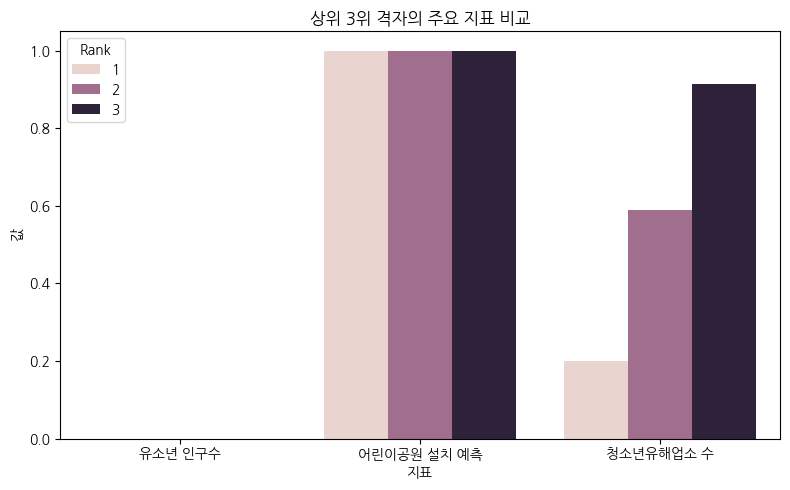

In [ ]:
top3 = top100[top100['rank'].isin([1, 2, 3])]

# 시각화 대상 컬럼 설정
columns = ['유소년_인구수', '어린이공원_설치_예측', '청소년유해업소_수']
labels = ['유소년 인구수', '어린이공원 설치 예측', '청소년유해업소 수']

# 데이터 변형 (melt)
plot_data = top3[['rank'] + columns].melt(id_vars='rank', var_name='지표', value_name='값')

# 컬럼명을 한글 라벨로 매핑
label_map = dict(zip(columns, labels))
plot_data['지표'] = plot_data['지표'].map(label_map)

# 시각화
plt.figure(figsize=(8, 5))
sns.barplot(data=plot_data, x='지표', y='값', hue='rank')
plt.title('상위 3위 격자의 주요 지표 비교')
plt.xlabel('지표')
plt.ylabel('값')
plt.legend(title='Rank')
plt.tight_layout()
plt.show()